In [ ]:
!pip install wordcloud==1.8.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.6/363.6 KB 19.4 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator


In [ ]:
movie_ratings = pd.read_csv("filmtv_movies - ENG.csv")
movie_ratings.head()

,filmtv_id,title,year,genre,duration,country,directors,actors,avg_vote,critics_vote,public_vote,total_votes,description,notes,humor,rhythm,effort,tension,erotism
0,2,Bugs Bunny's Third Movie: 1001 Rabbit Tales,1982,Animation,76,United States,"David Detiege, Art Davis, Bill Perez",NaN,7.7,8.00,7.0,21,"With two protruding front teeth, a slightly sl...","These are many small independent stories, whic...",3,3,0,0,0
1,3,18 anni tra una settimana,1991,Drama,98,Italy,Luigi Perelli,"Kim Rossi Stuart, Simona Cavallari, Ennio Fant...",6.5,6.00,7.0,4,"Samantha, not yet eighteen, leaves the comfort...","Luigi Perelli, the director of the ""Piovra"", o...",0,2,0,2,0
2,17,Ride a Wild Pony,1976,Romantic,91,United States,Don Chaffey,"Michael Craig, John Meillon, Eva Griffith, Gra...",5.6,6.00,5.0,9,"In the Australia of the pioneers, a boy and a ...","""Ecological"" story with a happy ending, not wi...",1,2,1,0,0
3,18,Diner,1982,Comedy,95,United States,Barry Levinson,"Mickey Rourke, Steve Guttenberg, Ellen Barkin,...",7.0,8.00,6.0,18,Five boys from Baltimore have a habit of meeti...,A cast of will be famous for Levinson's direct...,2,2,0,1,2
4,20,A che servono questi quattrini?,1942,Comedy,85,Italy,Esodo Pratelli,"Eduardo De Filippo, Peppino De Filippo, Clelia...",5.9,5.33,7.0,14,"With a stratagem, the penniless and somewhat p...",Taken from the play by Armando Curcio that the...,3,1,1,0,0


In [ ]:
netflix_titles = pd.read_csv("netflix_titles_nov_2019.csv")
netflix_titles.head()

,show_id,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,type
0,81193313,Chocolate,NaN,"Ha Ji-won, Yoon Kye-sang, Jang Seung-jo, Kang ...",South Korea,"November 30, 2019",2019,TV-14,1 Season,"International TV Shows, Korean TV Shows, Roman...",Brought together by meaningful meals in the pa...,TV Show
1,81197050,Guatemala: Heart of the Mayan World,"Luis Ara, Ignacio Jaunsolo",Christian Morales,NaN,"November 30, 2019",2019,TV-G,67 min,"Documentaries, International Movies","From Sierra de las Minas to Esquipulas, explor...",Movie
2,81213894,The Zoya Factor,Abhishek Sharma,"Sonam Kapoor, Dulquer Salmaan, Sanjay Kapoor, ...",India,"November 30, 2019",2019,TV-14,135 min,"Comedies, Dramas, International Movies",A goofy copywriter unwittingly convinces the I...,Movie
3,81082007,Atlantics,Mati Diop,"Mama Sane, Amadou Mbow, Ibrahima Traore, Nicol...","France, Senegal, Belgium","November 29, 2019",2019,TV-14,106 min,"Dramas, Independent Movies, International Movies","Arranged to marry a rich man, young Ada is cru...",Movie
4,80213643,Chip and Potato,NaN,"Abigail Oliver, Andrea Libman, Briana Buckmast...","Canada, United Kingdom",NaN,2019,TV-Y,2 Seasons,Kids' TV,"Lovable pug Chip starts kindergarten, makes ne...",TV Show


In [ ]:
# Inner join on release_year, title (netflix) and title, year(movie_ratings)
merged = movie_ratings.merge(netflix_titles, left_on=['title','year'], right_on=['title','release_year'])
merged.head()


,filmtv_id,title,year,genre,duration_x,country_x,directors,actors,avg_vote,critics_vote,...,director,cast,country_y,date_added,release_year,rating,duration_y,listed_in,description_y,type
0,241,Alice Doesn't Live Here Anymore,1974,Drama,107,United States,Martin Scorsese,"Ellen Burstyn, Kris Kristofferson, Harvey Keit...",7.7,7.73,...,Martin Scorsese,"Ellen Burstyn, Kris Kristofferson, Billy Green...",United States,"July 1, 2019",1974,PG,112 min,"Classic Movies, Comedies, Dramas",A widowed singer and single mother starts over...,Movie
1,975,White Christmas,1954,Musical,90,United States,Michael Curtiz,"Bing Crosby, Danny Kaye, Rosemary Clooney, Ver...",7.2,7.57,...,Michael Curtiz,"Bing Crosby, Danny Kaye, Rosemary Clooney, Ver...",United States,"July 15, 2012",1954,TV-G,120 min,"Children & Family Movies, Classic Movies, Come...",Two war buddies fall for two sisters and follo...,Movie
2,1337,Carrie,1976,Horror,95,United States,Brian De Palma,"Sissy Spacek, William Katt, Piper Laurie, Amy ...",7.9,7.80,...,Brian De Palma,"Sissy Spacek, Piper Laurie, Amy Irving, Willia...",United States,"June 1, 2019",1976,R,98 min,"Classic Movies, Cult Movies, Horror Movies",An outcast teen with telekinetic ability lashe...,Movie
3,1551,The Cincinnati Kid,1965,Comedy,105,United States,Norman Jewison,"Steve McQueen, Edward G. Robinson, Ann-Margret...",7.2,7.33,...,Norman Jewison,"Steve McQueen, Edward G. Robinson, Ann-Margret...",United States,"November 1, 2019",1965,TV-14,103 min,"Classic Movies, Dramas","In Depression-era New Orleans, cocksure stud p...",Movie
4,1970,Dad,1989,Drama,117,United States,Gary David Goldberg,"Jack Lemmon, Ted Danson, Olympia Dukakis, Kath...",4.9,4.00,...,Gary David Goldberg,"Jack Lemmon, Ted Danson, Olympia Dukakis, Kath...",United States,"April 1, 2018",1989,PG,117 min,Dramas,Family bonds are revived after a father is dia...,Movie


In [ ]:
merged_copy = merged.copy()
merged_copy = merged_copy.drop(["filmtv_id", "country_x","actors","directors","total_votes","show_id","director","cast","country_y","date_added","release_year","duration_y"], axis=1)
merged_copy

,title,year,genre,duration_x,avg_vote,critics_vote,public_vote,description_x,notes,humor,rhythm,effort,tension,erotism,rating,listed_in,description_y,type
0,Alice Doesn't Live Here Anymore,1974,Drama,107,7.7,7.73,8.0,"A widow after an unfortunate marriage, Alice, ...",A young but already biting Scorsese offers us ...,2,3,3,3,1,PG,"Classic Movies, Comedies, Dramas",A widowed singer and single mother starts over...,Movie
1,White Christmas,1954,Musical,90,7.2,7.57,7.0,Two former comrades who have set up a variety ...,"Beautiful songs by Irving Berlin, including ""W...",3,3,0,0,1,TV-G,"Children & Family Movies, Classic Movies, Come...",Two war buddies fall for two sisters and follo...,Movie
2,Carrie,1976,Horror,95,7.9,7.80,8.0,Carrie Withe is a girl who received an obsessi...,NaN,0,2,2,4,1,R,"Classic Movies, Cult Movies, Horror Movies",An outcast teen with telekinetic ability lashe...,Movie
3,The Cincinnati Kid,1965,Comedy,105,7.2,7.33,7.0,Cincinnati Kid is a young champion who is maki...,NaN,2,3,2,3,2,TV-14,"Classic Movies, Dramas","In Depression-era New Orleans, cocksure stud p...",Movie
4,Dad,1989,Drama,117,4.9,4.00,6.0,Jake Tremont (Lemmon) lives with his wife away...,"After the 1980s, films of good feelings return...",0,2,1,1,0,PG,Dramas,Family bonds are revived after a father is dia...,Movie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
843,Minimalism: A Documentary About the Important ...,2016,Documentary,78,7.0,NaN,7.0,How could our lives improve if we reduced the ...,NaN,0,0,0,0,0,TV-14,Documentaries,People dedicated to rejecting the American ide...,Movie
844,Kis Kisko Pyaar Karoon,2015,Comedy,133,3.8,NaN,4.0,"With his three different identities (Shiv, Ram...",NaN,0,0,0,0,0,TV-PG,"Comedies, International Movies","A man's decision to marry three women, to keep...",Movie
845,Deviant Love,2019,Thriller,87,4.9,NaN,5.0,Jamie's married life falls apart when she find...,NaN,0,0,0,0,0,TV-14,Thrillers,"In a tailspin after her marriage collapses, Ja...",Movie
846,Time Trap,2018,Fantasy,87,5.4,NaN,5.0,An archeology professor disappears after enter...,NaN,0,0,0,0,0,TV-14,"Action & Adventure, Sci-Fi & Fantasy",While searching for their missing archaeology ...,Movie


In [ ]:
category_cols = []

In [ ]:
for cat in list(set(merged['listed_in'])):
    cats = cat.strip("'").split(",")
    for ca in cats:
        if ca in category_cols:
            pass
        else:
            category_cols.append(ca.strip())

In [ ]:
category_cols=[cat.strip() for cat in category_cols]
# category_cols.sort()
category_set = list(set(category_cols))
print(category_set)

# horror: Average rating = 3.71
# music: ag rating 4.0/10

['Classic & Cult TV', 'Comedies', 'Cult Movies', 'Sports Movies', 'Classic Movies', 'Independent Movies', 'Music & Musicals', 'LGBTQ Movies', 'International TV Shows', 'TV Mysteries', 'Documentaries', 'Children & Family Movies', 'International Movies', 'Dramas', 'TV Sci-Fi & Fantasy', 'Sci-Fi & Fantasy', 'Docuseries', 'Thrillers', 'TV Dramas', 'Stand-Up Comedy', 'Crime TV Shows', 'Romantic Movies', 'Action & Adventure', 'Horror Movies', 'British TV Shows', 'Faith & Spirituality']


In [ ]:
data = merged.copy()
for col in category_set:
    data[col] = data['listed_in'].apply(lambda x: 1 if col in x else 0)

In [ ]:
quant = ['year','duration_x','avg_vote','critics_vote','public_vote','humor']

In [ ]:
data

,filmtv_id,title,year,genre,duration_x,country_x,directors,actors,avg_vote,critics_vote,...,Docuseries,Thrillers,TV Dramas,Stand-Up Comedy,Crime TV Shows,Romantic Movies,Action & Adventure,Horror Movies,British TV Shows,Faith & Spirituality
0,241,Alice Doesn't Live Here Anymore,1974,Drama,107,United States,Martin Scorsese,"Ellen Burstyn, Kris Kristofferson, Harvey Keit...",7.7,7.73,...,0,0,0,0,0,0,0,0,0,0
1,975,White Christmas,1954,Musical,90,United States,Michael Curtiz,"Bing Crosby, Danny Kaye, Rosemary Clooney, Ver...",7.2,7.57,...,0,0,0,0,0,0,0,0,0,0
2,1337,Carrie,1976,Horror,95,United States,Brian De Palma,"Sissy Spacek, William Katt, Piper Laurie, Amy ...",7.9,7.80,...,0,0,0,0,0,0,0,1,0,0
3,1551,The Cincinnati Kid,1965,Comedy,105,United States,Norman Jewison,"Steve McQueen, Edward G. Robinson, Ann-Margret...",7.2,7.33,...,0,0,0,0,0,0,0,0,0,0
4,1970,Dad,1989,Drama,117,United States,Gary David Goldberg,"Jack Lemmon, Ted Danson, Olympia Dukakis, Kath...",4.9,4.00,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
843,184241,Minimalism: A Documentary About the Important ...,2016,Documentary,78,United States,Matt D'Avella,"Dan Harris, Ryan Nicodemus, Rick Hanson, Jesse...",7.0,NaN,...,0,0,0,0,0,0,0,0,0,0
844,184390,Kis Kisko Pyaar Karoon,2015,Comedy,133,India,"Abbas Alibhai Burmawalla, Mastan Alibhai Burma...","Kapil Sharma, Simran Kaur Mundi, Manjari Fadnn...",3.8,NaN,...,0,0,0,0,0,0,0,0,0,0
845,187511,Deviant Love,2019,Thriller,87,United States,Michael Feifer,"Emma Bell, Nick Ballard, Bradley Bundlie, Gail...",4.9,NaN,...,0,1,0,0,0,0,0,0,0,0
846,193470,Time Trap,2018,Fantasy,87,United States,"Mark Dennis, Ben Foster","Andrew Wilson, Cassidy Gifford, Brianne Howey,...",5.4,NaN,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
alt.Chart(data).mark_bar().encode(
    x=alt.X('public_vote:O'),
    y='count():Q'
).facet(
    facet='genre',
    columns=3
).properties(
    title= "Distribution of Public Vote Ratings Based on Genre"
)

alt.FacetChart(...)

In [ ]:
# Number of movies by genre 
for cat in category_set: 
    print(cat,np.sum(data[cat]==1))

Classic & Cult TV 1
Comedies 247
Cult Movies 24
Sports Movies 28
Classic Movies 29
Independent Movies 188
Music & Musicals 25
LGBTQ Movies 17
International TV Shows 2
TV Mysteries 2
Documentaries 55
Children & Family Movies 77
International Movies 168
Dramas 396
TV Sci-Fi & Fantasy 1
Sci-Fi & Fantasy 84
Docuseries 1
Thrillers 151
TV Dramas 6
Stand-Up Comedy 1
Crime TV Shows 5
Romantic Movies 87
Action & Adventure 178
Horror Movies 72
British TV Shows 1
Faith & Spirituality 7


In [ ]:
data_copy = data.copy()
data_copy = data_copy.drop(["filmtv_id", "country_x","actors","directors","total_votes","show_id","director","cast","country_y","date_added","release_year","duration_y"], axis=1)
# data_copy

In [ ]:
data_copy.to_csv("review_ratings.csv",sep='^')

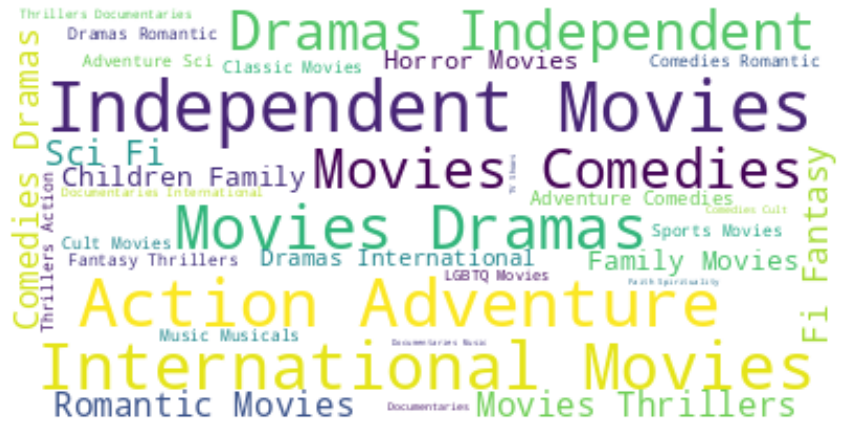

In [ ]:
text = " ".join(i for i in merged.listed_in)
wordcloud = WordCloud(background_color="white").generate(text)
plt.figure(figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
data_cols = list(data.columns)
# data_cols

In [ ]:
genre_cat = 'Dramas'

In [ ]:
x1 = 'year'

In [ ]:
y1 = 'avg_vote'

In [ ]:
column = 'avg_vote'

In [ ]:
genre = 'Music'

In [ ]:
data = data.drop(columns = [col for col in data.columns if '_y' in col])
x1_columns = data.columns

y1_columns = [i for i in  data.columns if i!=x1]
y1_columns

['filmtv_id',
 'title',
 'genre',
 'duration_x',
 'country_x',
 'directors',
 'actors',
 'avg_vote',
 'critics_vote',
 'public_vote',
 'total_votes',
 'description_x',
 'notes',
 'humor',
 'rhythm',
 'effort',
 'tension',
 'erotism',
 'show_id',
 'director',
 'cast',
 'date_added',
 'rating',
 'listed_in',
 'type',
 'Classic & Cult TV',
 'Comedies',
 'Cult Movies',
 'Sports Movies',
 'Classic Movies',
 'Independent Movies',
 'Music & Musicals',
 'LGBTQ Movies',
 'International TV Shows',
 'TV Mysteries',
 'Documentaries',
 'Children & Family Movies',
 'International Movies',
 'Dramas',
 'TV Sci-Fi & Fantasy',
 'Sci-Fi & Fantasy',
 'Docuseries',
 'Thrillers',
 'TV Dramas',
 'Stand-Up Comedy',
 'Crime TV Shows',
 'Romantic Movies',
 'Action & Adventure',
 'Horror Movies',
 'British TV Shows',
 'Faith & Spirituality']

In [ ]:
alt.Chart(data).mark_circle().encode(
    alt.X('critics_vote', bin=True, scale=alt.Scale(zero=False)),
    alt.Y('public_vote', bin=True),
    size='count()',
    color=alt.Color('genre', legend=alt.Legend(
        orient='none',
        legendX=520, legendY=0,
        direction='vertical',
        titleAnchor='middle')),
    tooltip=['genre','public_vote','count()']
).properties(
    title= "How do Critic Reviews Compare to Public Reviews?"
).interactive()


alt.Chart(...)

In [ ]:
# This chart is based off of two variables

alt.Chart(data).mark_point().encode(
    alt.X(x1,
        scale=alt.Scale(zero=False)
    ),
    # x=x1,
    y=y1,
    color='genre',
    tooltip=['title','avg_vote','humor','effort']
).properties(
    title= str(x1) + str(" vs ") + str(y1)
).interactive()


alt.Chart(...)

In [ ]:
alt.Chart(data).mark_point().encode(
    # Map the sepalLength to x-axis
    x='title',
    # Map the petalLength to y-axis
    y='avg_vote',
    # Map the species to shape
    color='genre',
    tooltip=['title','year']
).properties(
    title="Title vs Average Rating"
).interactive()

alt.Chart(...)

In [ ]:
for genre_cate in category_set:
    output_1 = data.groupby(genre_cate)[column].mean()
    output_1 = output_1.reset_index() # can we rename the first column? 
    output_1[genre_cate] = output_1[genre_cate].apply(lambda x: x==1) 
    print(output_1)

   Classic & Cult TV  avg_vote
0              False  5.669421
1               True  8.400000
   Comedies  avg_vote
0     False  5.802496
1      True  5.356680
   Cult Movies  avg_vote
0        False  5.644539
1         True  6.637500
   Sports Movies  avg_vote
0          False  5.668780
1           True  5.785714
   Classic Movies  avg_vote
0           False  5.606227
1            True  7.548276
   Independent Movies  avg_vote
0               False  5.613333
1                True  5.880851
   Music & Musicals  avg_vote
0             False  5.657716
1              True  6.164000
   LGBTQ Movies  avg_vote
0         False  5.666185
1          True  5.988235
   International TV Shows  avg_vote
0                   False  5.672695
1                    True  5.650000
   TV Mysteries  avg_vote
0         False  5.671868
1          True  6.000000
   Documentaries  avg_vote
0          False  5.618916
1           True  6.447273
   Children & Family Movies  avg_vote
0                     False  5.7

In [ ]:
category_set.index('Dramas')

13

In [ ]:
output = data.groupby(genre_cat)[column].mean()
output = output.reset_index() # can we rename the first column? 
output[genre_cat] = output[genre_cat].apply(lambda x: "Selected genre" if x==1 else "Other genre") 

print(output)
alt.Chart(output).mark_bar().encode(
    x=str(genre_cat),
    y=column,
    tooltip = ["avg_vote"]
).properties(
    width=400,
    height=300,
    title="Average Ratings of "+str(genre_cat)+" Categorized Films vs Non "+str(genre_cat) + " Categorized Films"
).interactive()

           Dramas  avg_vote
0     Other genre  5.370796
1  Selected genre  6.017172


alt.Chart(...)

In [ ]:
df = data.groupby(by=["year", "genre"]).size().reset_index(name="counts")
alt.Chart(data).mark_bar().encode(
    x='year',
    y='count(genre)',
    color = 'genre',
    tooltip=['year','genre','count()']
).properties(
    title="Count of Records by Genre and Year"
).interactive()

alt.Chart(...)

In [ ]:
_deepnote_run_altair(lgbtq_movies, """{"$schema":"https://vega.github.io/schema/vega-lite/v4.json","mark":{"type":"bar","tooltip":true},"height":220,"autosize":{"type":"fit"},"data":{"name":"placeholder"},"encoding":{"x":{"field":"title","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}},"y":{"field":"critics_vote","type":"quantitative","sort":null,"scale":{"type":"linear","zero":true}},"color":{"field":"","type":"nominal","sort":null,"scale":{"type":"linear","zero":false}}}}""")

NameError: name 'lgbtq_movies' is not defined

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=21bf25da-b52d-4747-8ce6-0a60c023609b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>